Device being used: cuda:0


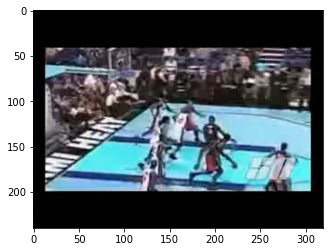

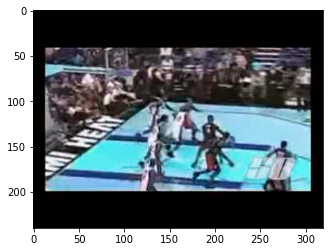

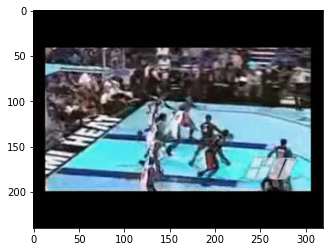

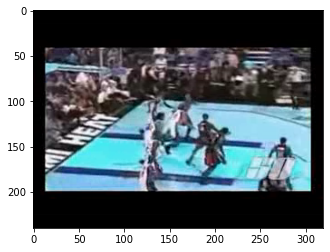

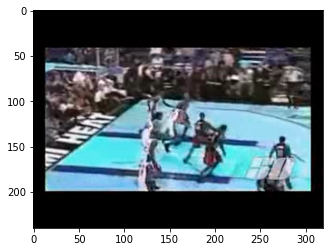

...

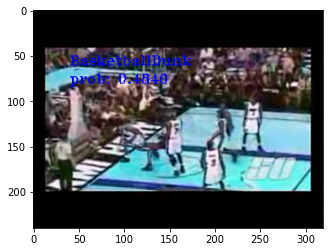

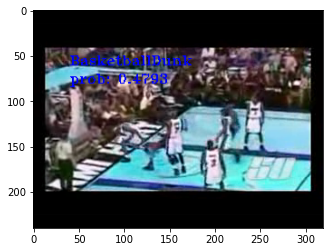

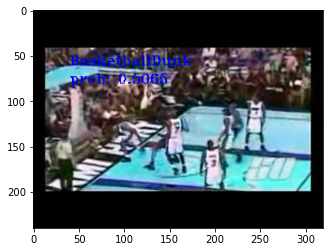

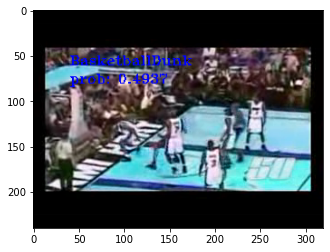

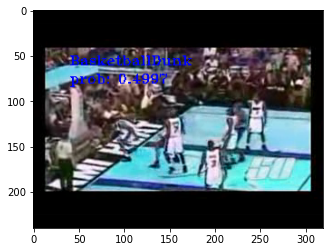

In [9]:
import torch
import numpy as np
from network import C3D_model, R2Plus1D_model
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as img
torch.backends.cudnn.benchmark = True

def CenterCrop(frame, size):
    h, w = np.shape(frame)[0:2]
    th, tw = size
    x1 = int(round((w - tw) / 2.))
    y1 = int(round((h - th) / 2.))

    frame = frame[y1:y1 + th, x1:x1 + tw, :]
    return np.array(frame).astype(np.uint8)


def center_crop(frame):
    frame = frame[8:120, 30:142, :]
    return np.array(frame).astype(np.uint8)


def main():
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    print("Device being used:", device)

    with open('./dataloaders/ucf_labels.txt', 'r') as f:
        class_names = f.readlines()
        f.close()
    # init model
    model = R2Plus1D_model.R2Plus1DClassifier(num_classes=10, layer_sizes=(2, 2, 2, 2))
    # checkpoint = torch.load('./run/run_2/models/R2Plus1D-ucf101_epoch-29.pth.tar', map_location=lambda storage, loc: storage)
    checkpoint = torch.load('./run/run_2/models/R2Plus1D-ucf101_epoch-29.pth.tar')
    model.load_state_dict(checkpoint['state_dict'])
    model.to(device)
    model.eval()

    # read video
    video = '../UCF-101/BasketballDunk/v_BasketballDunk_g23_c01.avi'
    cap = cv2.VideoCapture(video)
    retaining = True
    
    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    out = cv2.VideoWriter('output.avi', fourcc, 16.0, (320,  240))
    clip = []
    while retaining:
        retaining, frame = cap.read()
        if not retaining and frame is None:
            continue
        tmp_ = center_crop(cv2.resize(frame, (171, 128)))
        tmp = tmp_ - np.array([[[90.0, 98.0, 102.0]]])
        clip.append(tmp)
        if len(clip) == 16:
            inputs = np.array(clip).astype(np.float32)
            inputs = np.expand_dims(inputs, axis=0)
            inputs = np.transpose(inputs, (0, 4, 1, 2, 3))
            inputs = torch.from_numpy(inputs)
            inputs = torch.autograd.Variable(inputs, requires_grad=False).to(device)
            with torch.no_grad():
                outputs = model.forward(inputs)

            probs = torch.nn.Softmax(dim=1)(outputs)
            label = torch.max(probs, 1)[1].detach().cpu().numpy()[0]
            cv2.putText(frame, class_names[label].split(' ')[-1].strip(), (40, 60),
                        cv2.FONT_HERSHEY_TRIPLEX, 0.5,
                        (0, 0, 255), 1)
            cv2.putText(frame, "prob: %.4f" % probs[0][label], (40, 80),
                        cv2.FONT_HERSHEY_TRIPLEX, 0.5,
                        (0, 0, 255), 1)
            clip.pop(0)
        
        out.write(frame)
        plt.imshow(frame)
        plt.show()

    cap.release()
    out.release()
    cv2.destroyAllWindows()


if __name__ == '__main__':
    main()